### Using OpenCV to detect and crop the face in the images

In [1]:
import numpy as np
import cv2 as cv
import os
import matplotlib.pyplot as plt

In [2]:
#enter img path for testing 
img= cv.imread('dataset\original_dataset\Ricardo\Ricardo5.jpg')
height, width, channels = img.shape
print('Size of img:',height,'by',width)
print('Color channel:',channels)

Size of img: 3024 by 3024
Color channel: 3


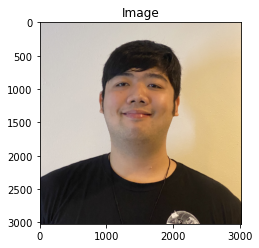

In [3]:
fig1 = plt.figure()
ax1 = fig1.add_axes((0.1, 0.2, 0.8, 0.7))
ax1.set_title('Image')
plt.imshow(cv.cvtColor(img,cv.COLOR_BGR2RGB))
plt.show()

In [4]:
cv_base_dir = os.path.dirname(os.path.abspath(cv.__file__))
haar_model_face = os.path.join(cv_base_dir,'data/haarcascade_frontalface_default.xml')
face_cascade = cv.CascadeClassifier(haar_model_face)

In [5]:
def adjusted_detect_face(img):
     
    face_img = img.copy()
     
    face_rect = face_cascade.detectMultiScale(face_img, scaleFactor = 1.2, minNeighbors =10, minSize=[200,200],maxSize=[2000,2000])
    
    for (x, y, w, h) in face_rect:
        #cv.rectangle(face_img, (x, y),(x + w, y + h), (255, 255, 255), 10)
        face_img =face_img[y:y+h,x:x+w]
       
    return face_img

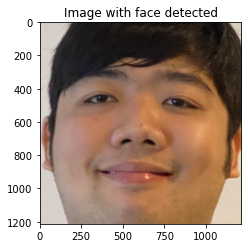

In [6]:
face=adjusted_detect_face(img)
fig1 = plt.figure()
ax2 = fig1.add_axes((0.1, 0.2, 0.8, 0.7))
ax2.set_title('Image with face detected')
plt.imshow(cv.cvtColor(face,cv.COLOR_BGR2RGB))

training data path: dataset\train_data
testing data path: dataset\test_data 

Under Damien file:
Damien0.jpg
path: dataset\original_dataset\Damien\Damien0.jpg

Damien1.jpg
path: dataset\original_dataset\Damien\Damien1.jpg

Damien10.jpg
path: dataset\original_dataset\Damien\Damien10.jpg

Damien11.jpeg
path: dataset\original_dataset\Damien\Damien11.jpeg

Damien12.jpeg
path: dataset\original_dataset\Damien\Damien12.jpeg

Damien13.jpeg
path: dataset\original_dataset\Damien\Damien13.jpeg

Damien14.jpeg
path: dataset\original_dataset\Damien\Damien14.jpeg

Damien15.jpeg
path: dataset\original_dataset\Damien\Damien15.jpeg

Damien16.jpeg
path: dataset\original_dataset\Damien\Damien16.jpeg

Damien17.jpeg
path: dataset\original_dataset\Damien\Damien17.jpeg

Damien18.jpeg
path: dataset\original_dataset\Damien\Damien18.jpeg

Damien2.jpg
path: dataset\original_dataset\Damien\Damien2.jpg

Damien3.jpg
path: dataset\original_dataset\Damien\Damien3.jpg

Damien4.jpg
path: dataset\original_dataset\Damien\

C:\Users\daiya\AppData\Local\Temp\ipykernel_29928\1280936280.py:50: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()


Frank5.jpg
path: dataset\original_dataset\Frank\Frank5.jpg

Frank6.jpg
path: dataset\original_dataset\Frank\Frank6.jpg

Frank7.jpg
path: dataset\original_dataset\Frank\Frank7.jpg

Frank8.jpg
path: dataset\original_dataset\Frank\Frank8.jpg

Frank9.jpg
path: dataset\original_dataset\Frank\Frank9.jpg

Under JH file:
JH0.jpeg
path: dataset\original_dataset\JH\JH0.jpeg

JH1.jpeg
path: dataset\original_dataset\JH\JH1.jpeg

JH2.jpeg
path: dataset\original_dataset\JH\JH2.jpeg

JH3.jpeg
path: dataset\original_dataset\JH\JH3.jpeg

JH4.jpeg
path: dataset\original_dataset\JH\JH4.jpeg

JH5.jpeg
path: dataset\original_dataset\JH\JH5.jpeg

JH6.jpeg
path: dataset\original_dataset\JH\JH6.jpeg

JH7.jpeg
path: dataset\original_dataset\JH\JH7.jpeg

Under Ricardo file:
Ricardo0.jpg
path: dataset\original_dataset\Ricardo\Ricardo0.jpg

Ricardo1.jpg
path: dataset\original_dataset\Ricardo\Ricardo1.jpg

Ricardo2.jpg
path: dataset\original_dataset\Ricardo\Ricardo2.jpg

Ricardo3.jpg
path: dataset\original_dataset

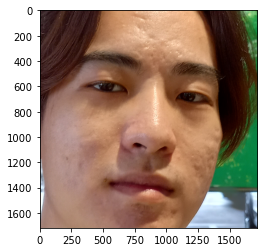

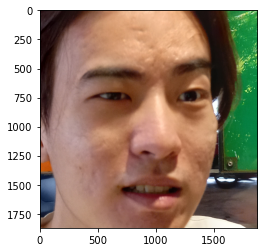

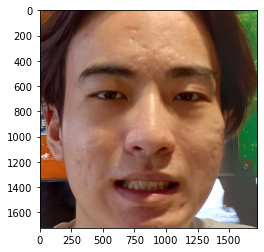

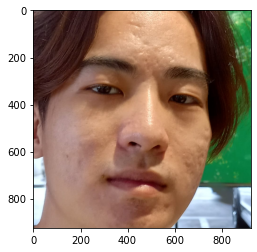

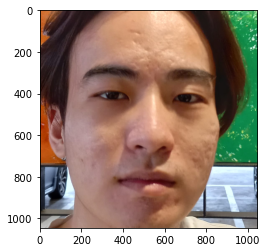

...

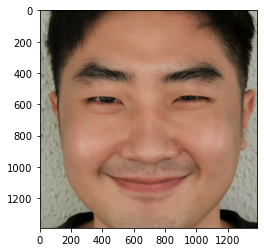

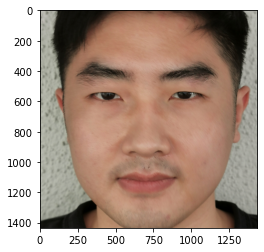

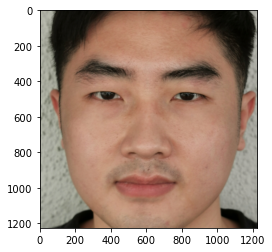

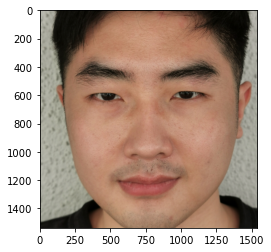

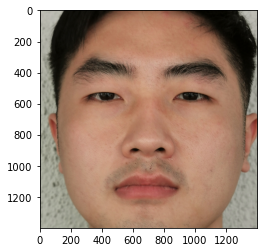

In [8]:
#faolder_path is folder where the dataset of images is store
folder_path= 'dataset\original_dataset'

#function to crop all the images in the dataset folder
def preprocess_crop_img(folder_path):
    
    #dimension for resizing
    dim=(500,500)
    
    #get the diretories from the input folder path
    data_folder = os.listdir(folder_path) 
    
    #get the path to store for training and testing data
    train_data_path= os.path.join(os.path.dirname(folder_path), 'train_data')
    test_data_path = os.path.join(os.path.dirname(folder_path), 'test_data')
    print('training data path:',train_data_path)
    print('testing data path:',test_data_path,'\n')
    
    #person_name: folder name of unique person in the folder
    for person_name in data_folder:
        
        print(f'Under {person_name} file:')
        person_imgs_name = os.listdir(f'{folder_path}\\{person_name}')
        
        #create new folders to store 
        train_person_name= os.path.join(train_data_path, 'train_'+person_name)
        test_person_name= os.path.join(test_data_path, 'test_'+person_name)
        try:
            os.makedirs(train_person_name)
            os.makedirs(test_person_name)
        except FileExistsError:
            pass
        
        #person_img: name of image .jpg under that unique person
        count=0
        for person_img in person_imgs_name:
            
            #check if the person_img is a jpg or jpeg
            if person_img.endswith('.jpg') or person_img.endswith('.jpeg'):
            
                print(person_img)
                img_path= f'{folder_path}\\{person_name}\\{person_img}'
                print(f'path: {img_path}\n')

                #detect and crop the face in the image
                image = cv.imread(img_path)
                cropped_img = adjusted_detect_face(image)
            
                #to show cropped image in matplot
                fig = plt.figure()
                plt.imshow(cv.cvtColor(cropped_img,cv.COLOR_BGR2RGB))
            
                #resize the img, dim= dimension of final image
                final_img= cv.resize(cropped_img,dim,interpolation=cv.INTER_AREA)
            
                #save the first 7 as training
                if count<7 :
                    img_name= os.path.join(train_person_name,'train_'+person_img)
                    cv.imwrite(img_name,final_img)
                
                #save rest as testing    
                else:
                    img_name= os.path.join(test_person_name,'test_'+person_img)
                    cv.imwrite(img_name,final_img)
            
                #count to next img to decide whether to store in test or train
                count=count+1
                            
    
#test of function above
preprocess_crop_img(folder_path)